<a href="https://colab.research.google.com/github/deviandinifebrianti/PCVK_Genap_2023/blob/main/week7.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# MODUL 7 – Filter Spasial Low Pass Filter, High Pass Filter, Point Detection, Line Detection, Edge Detection

### Nama  : Devi Andini Febrianti
### NIM   : 2141720189
### Kelas : D4TI-3H
### No    : 09

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import numpy as np
import pandas as pd
import cv2 as cv
import matplotlib.pyplot as plt
import math

from google.colab.patches import cv2_imshow
from PIL import Image as im


## Fungsi Konvolusi

In [ ]:
def convolution(image, kernel, stride, padding):
    tinggi = image.shape[0]
    lebar = image.shape[1]

    tinggi_kernel = kernel.shape[0]
    lebar_kernel = kernel.shape[1]

    # Menghitung ukuran hasil konvolusi
    tinggi_output = int((tinggi + 2 * padding - tinggi_kernel) / stride) + 1
    lebar_output = int((lebar + 2 * padding - lebar_kernel) / stride) + 1

    # Membuat array untuk menyimpan hasil konvolusi
    image_result = np.zeros((tinggi_output, lebar_output))

    # Menambahkan padding
    image_padded = np.pad(image, ((padding, padding), (padding, padding)), mode='constant')

    for y in range(0, tinggi_output):
        for x in range(0, lebar_output):
            # Perhitungan batas untuk slicing
            y_start = y * stride
            y_end = y_start + tinggi_kernel

            x_start = x * stride
            x_end = x_start + lebar_kernel

            # Melakukan konvolusi
            image_result[y, x] = np.sum(image_padded[y_start:y_end, x_start:x_end] * kernel)

    return image_result

## Load Citra

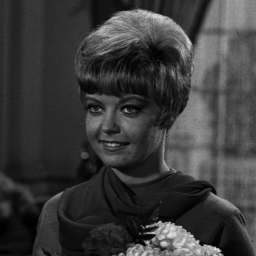

In [ ]:
img = cv.imread('/content/drive/MyDrive/PCVK/female.tiff')
img_gray = cv.cvtColor(img, cv.COLOR_BGR2GRAY)
cv2_imshow(img_gray)

# Menentukan Kernel yang digunakan

## Sharpening

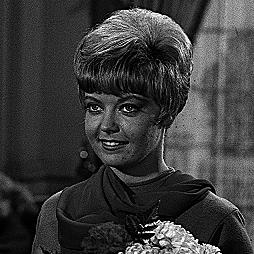

In [ ]:
# Sharpening / Penajaman
kernel_sharpen = np.array( [[0,-1,0],
                            [-1,5,-1],
                            [0,-1,0]])
output_image = convolution(img_gray, kernel_sharpen, 1, 0)
cv2_imshow(output_image)

## Embos

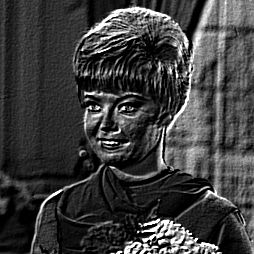

In [ ]:
# Emboss
kernel_emboss = np.array( [[-2,-1,0],
                            [-1,1,1],
                            [0,1,2]])
output_image = convolution(img_gray, kernel_emboss, 1, 0)
cv2_imshow(output_image)

## Left Sobel Edge Detection

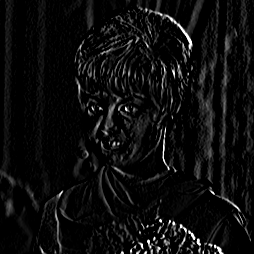

In [ ]:
# Left Sobel Edge Detection
kernel_lsed = np.array( [[1,0,-1],
                            [2,0,-2],
                            [1,0,-1]])
output_image = convolution(img_gray, kernel_lsed, 1, 0)
cv2_imshow(output_image)

## Canny Edge Detection

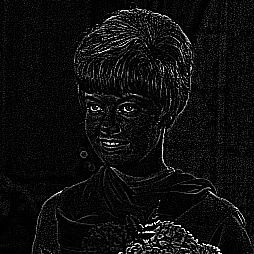

In [ ]:
# Canny Edge Detection
kernel_canny = np.array( [[-1,-1,-1],
                         [-1,8,-1],
                         [-1,-1,-1]])
output_image = convolution(img_gray, kernel_canny, 1, 0)
cv2_imshow(output_image)

## Prewitt Edge Detection

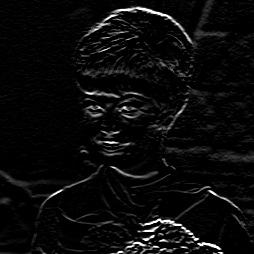

In [ ]:
# Prewitt Edge Detection
kernel_prewitt = np.array( [[-1,-1,-1],
                           [0,0,0],
                           [1,1,1]])
output_image = convolution(img_gray, kernel_prewitt, 1, 0)
cv2_imshow(output_image)

## 5x5 Gaussian Blur

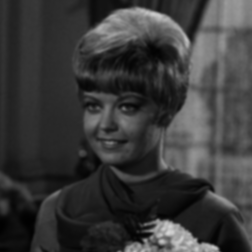

In [ ]:
# Gaussian Blur
kernel_gaussian_blur = np.array([[1, 4, 6, 4, 1],
                                [4, 16, 24, 16, 4],
                                [6, 24, 36, 24, 6],
                                [4, 16, 24, 16, 4],
                                [1, 4, 6, 4, 1]]) / 256

output_image = convolution(img_gray, kernel_gaussian_blur, 1, 0)
cv2_imshow(output_image)

## 21x21 Gaussian Blur

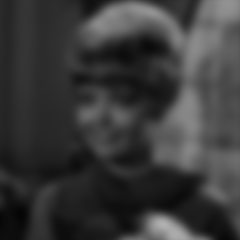

In [ ]:
# 21x21 Gaussian Blur

kernel_size = 21
sigma = math.sqrt(kernel_size)
gaussian_kernel = cv.getGaussianKernel(kernel_size, sigma)
gauss_kernel_21 = gaussian_kernel @ gaussian_kernel.transpose()

output_image = convolution(img_gray, gauss_kernel_21, 1, 2)
cv2_imshow(output_image)

# TUGAS
## Diketahui dataset KTP dengan kondisi citra yang berbeda. Lakukan perbaikan melalui implementasi teknik filterisasi dan detection setiap citra. Terapkan juga histogram equalization dan operasi aritmatika sebagai Teknik pendukung perbaikan citra KTP.

In [37]:
def convolution2d(image, kernel):
    tinggi = image.shape[0]
    lebar = image.shape[1]

    tinggi_kernel = kernel.shape[0]
    lebar_kernel = kernel.shape[1]

    start = int(lebar_kernel/2)

    image_result = np.copy(image)

    for y in range(start, tinggi - start):
        for x in range(start, lebar - start):
            value = 0

            for ky in range(tinggi_kernel):
                for kx in range(lebar_kernel):
                    i = y - start + ky
                    j = x - start + kx

                    value += image[i, j] * kernel[ky, kx]

            image_result[y, x] = np.clip(value, 0, 255)

    return image_result

def hitung_pixel(image):
  red = np.zeros(256)
  green = np.zeros(256)
  blue = np.zeros(256)

  # Melakukan perulangan untuk setiap piksel, kemudian di masukkan kedalam masing-masing histogram
  for i in range(image.shape[0]):
      for j in range(image.shape[1]):
          r, g, b = image[i, j]
          red[r] += 1
          green[g] += 1
          blue[b] += 1

  return red, green, blue

def histogram_equalization(image):

  # Menghitung histogram citra asli
  histo_asli = hitung_pixel(image)

  # Mengubah citra ke bentuk array Numpy
  img_array = np.asarray(image)

  # Step 1: Normalized cumulative histogram
  # Menghitung histogram kumulatif yang dinormalisasi
  histogram_array = np.bincount(img_array.flatten(), minlength=256)
  num_pixels = np.sum(histogram_array)
  histogram_array = histogram_array / num_pixels
  chistogram_array = np.cumsum(histogram_array)

  # Step 2: Pixel mapping lookup table
  transform_map = np.floor(255 * chistogram_array).astype(np.uint8)

  # Step 3: Transformation
  # Melakukan transformasi citra menggunakan lookup table
  img_list = list(img_array.flatten())
  eq_img_list = [transform_map[p] for p in img_list]
  eq_img_array = np.reshape(np.asarray(eq_img_list), img_array.shape)
  img2 = eq_img_array

  return img2

## Menggunakan beberapa KTP yang telah disediakan

## ktp.png

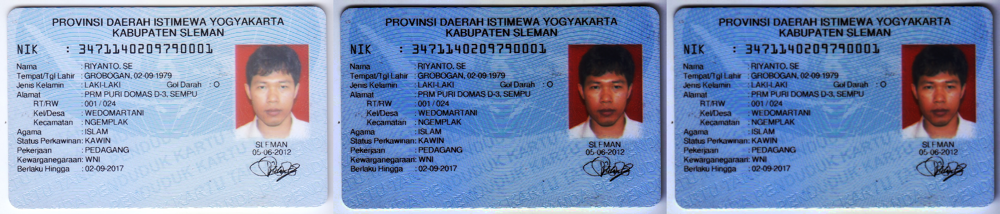

In [40]:
ktp = cv.imread('/content/drive/MyDrive/PCVK/ktp.png')
ktp_copy = np.copy(ktp)
ktp_result = histogram_equalization(ktp_copy)
ktp_filtered = convolution2d(ktp_result, kernel_gaussian_blur)

final_frame = cv.hconcat((ktp,ktp_result, ktp_filtered))
cv2_imshow(final_frame)

## ktp1.png

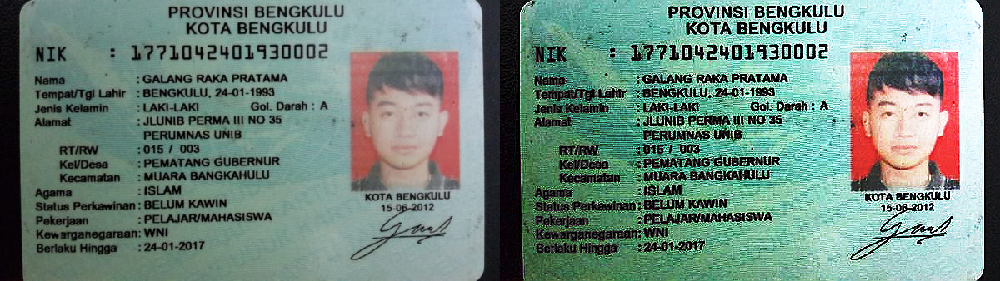

In [42]:
kernel_sharpen = np.array([[0, -1, 0],
                          [-1, 5, -1],
                          [0, -1, 0]], dtype=np.float32)

ktp1 = cv.imread('/content/drive/MyDrive/PCVK/ktp1.png')
ktp1_copy = np.copy(ktp1)
ktp1_result = histogram_equalization(ktp1_copy)
ktp1_filtered = convolution2d(ktp1_result, kernel_sharpen)

final_frame = cv.hconcat((ktp1, ktp1_filtered))
cv2_imshow(final_frame)

## ktp2.png

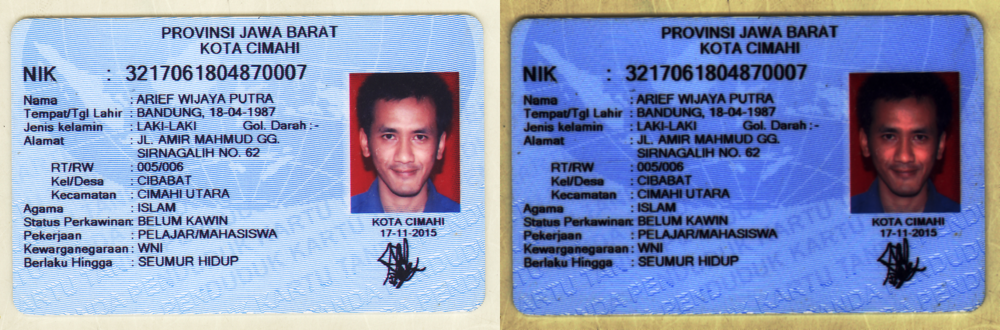

In [43]:
ktp2 = cv.imread('/content/drive/MyDrive/PCVK/ktp2.png')
ktp2_copy = np.copy(ktp2)
ktp2_result = histogram_equalization(ktp2_copy)
ktp2_filtered = convolution2d(ktp2_result, kernel_gaussian_blur)

final_frame = cv.hconcat((ktp2, ktp2_filtered))
cv2_imshow(final_frame)

## ktp3.png

In [ ]:
ktp3 = cv.imread('/content/drive/MyDrive/PCVK/ktp3.png')
ktp3_copy = np.copy(ktp3)
ktp3_result = histogram_equalization(ktp3_copy)
ktp3_filtered = convolution2d(ktp3_result, kernel_sharpen)

final_frame = cv.hconcat((ktp3, ktp3_filtered))
cv2_imshow(final_frame)

## ktp4.png

In [ ]:
ktp4 = cv.imread('/content/drive/MyDrive/PCVK/ktp4.png')
ktp4_copy = np.copy(ktp4)
ktp4_result = histogram_equalization(ktp4_copy)
ktp4_filtered = convolution2d(ktp4_result, kernel_gaussian_blur)

final_frame = cv.hconcat((ktp4, ktp4_filtered))
cv2_imshow(final_frame)

## ktp5.png

In [ ]:
ktp5 = cv.imread('/content/drive/MyDrive/PCVK/ktp5.png')
ktp5_copy = np.copy(ktp5)
ktp5_result = histogram_equalization(ktp5_copy)
ktp5_filtered = convolution2d(ktp5_result, kernel_gaussian_blur)

final_frame = cv.hconcat((ktp5, ktp5_filtered))
cv2_imshow(final_frame)

## ktp6.png

In [ ]:
ktp6 = cv.imread('/content/drive/MyDrive/PCVK/ktp6.png')
ktp6_copy = np.copy(ktp6)
ktp6_result = histogram_equalization(ktp6_copy)
ktp6_filtered = convolution2d(ktp6_result, kernel_gaussian_blur)

final_frame = cv.hconcat((ktp6, ktp6_filtered))
cv2_imshow(final_frame)

## KTP7.jpeg

In [ ]:
ktp7 = cv.imread('/content/drive/MyDrive/PCVK/KTP7.jpeg')
ktp7_copy = np.copy(ktp7)
ktp7_filtered = convolution2d(ktp7_copy, kernel_sharpen)

final_frame = cv.hconcat((ktp7, ktp7_filtered))
cv2_imshow(final_frame)